# Поиск мотива

## 1. Извлечение из БД сигналов всех типов

Можно работать напрямую с базой данных, но предварительный экспорт сигналов в бинарном виде экономит время.  
**Фильтрация**: извлекаются только такие SV, второй брейкпоинт которых не попадает в окрестность первого. (length > 256bp)

In [1]:
import sqlite3
con = sqlite3.connect('file:../hgdp_2022-04-27.db?mode=ro', uri=True)
cur = con.cursor()

In [2]:
!mkdir -p bin0427

In [3]:
files = {}
cur.execute(f"SELECT s.coverage, s.size, s.type, s.side FROM signal as s")

for sig, size, tp, side in cur.fetchall():
    if size < 256 and side != 'C': continue
    name = f"bin0427/HGDP_{tp}_{side}_filterd.bin"
    if name not in files: files[name] = open(name, 'wb')
    files[name].write(sig)

for name in files:
    print(f" -> {name}")
    files[name].close()

 -> bin0427/HGDP_DEL_L_filterd.bin
 -> bin0427/HGDP_DEL_R_filterd.bin
 -> bin0427/HGDP_DUP_L_filterd.bin
 -> bin0427/HGDP_DUP_R_filterd.bin
 -> bin0427/HGDP_CNV_loss_L_filterd.bin
 -> bin0427/HGDP_CNV_loss_R_filterd.bin
 -> bin0427/HGDP_CNV_gain_L_filterd.bin
 -> bin0427/HGDP_CNV_gain_R_filterd.bin
 -> bin0427/HGDP_INS_C_filterd.bin
 -> bin0427/HGDP_INV_L_filterd.bin
 -> bin0427/HGDP_INV_R_filterd.bin


## 2. Кластеризация. Бустрап, силуэт-индекс

Определение оптимального числа кластеров для кластеризации сигналов. 
Оценивается одтельно для каждого типа SV.  
Для работы требуется бинарный файл с сигналами определённого типа (получены на предыдущем шаге).

```bash
# Подсчёт силуэт-индекса на случайных 100 регионах 80 раз. 
# Среднее время работы 6 часов для каждого файла (n.jobs = 32):
for src in bin0427/*.bin; do 
  python3 Silhouette_KM.py $src 100 80; 
done
```

### Результаты

По оси X число кластеров, по Y силуэт-индекс:

In [4]:
import glob, json, os
import numpy as np
import matplotlib.pyplot as plt

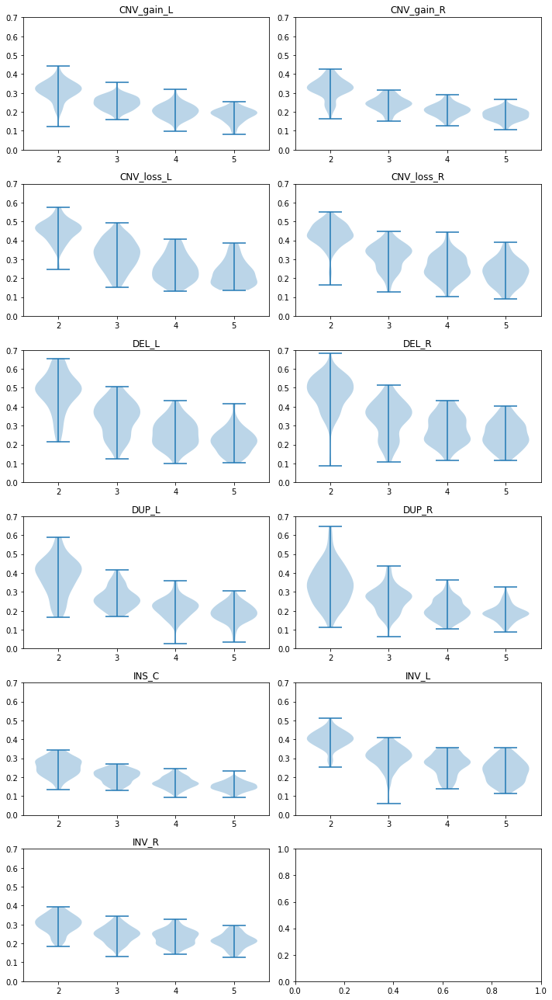

In [5]:
fig, axs = plt.subplots(6, 2, figsize=(10, 18))
for ax, js in zip(axs.flat, sorted(glob.glob('./bin0427/silhouette_*.json'))):
    name = os.path.basename(js).replace('silhouette_HGDP_', '').replace('.json', '')
    ax.set_title(f'{name}')
    with open(js, 'r') as f:
        table = json.load(f)
        vp = ax.violinplot(np.array(table), [2, 3, 4, 5], widths=0.8)
        ax.set(xlim=(1.4, 5.6), xticks=np.arange(2, 6), ylim=(0, 0.7))
fig.tight_layout()

Из графиков видно, что кластеризация более чем на два класса не оправдана

## 3. Допустимость сжатия сигнала для кластеризации

В целях экономии времени допустимо сжать сигнал в 8 раз. Проверка:  
1. Набор сигналов из БД кластеризуется (дважды, с разным `seed`-ом), получаем два варианта кластеризации (`C0` и `С1`)
2. Набор сигналов сжимается в 8 раз, кластеризуется снова (вариант `C2`).
3. Подсчитывается процент элементов `P1`, которые сохранили индикатор класса вне зависимости от `seed`-а — сравниваем `C0` с `C1`.
4. Подсчитывается процент элементов `P2`, которые сохранили индикатор класса до сжатия сигнала и после — сравниваем `C0` с `C2`.
5. Сравниваются распределения `P1` и `P2`

```bash
# Среднее время работы = 4 часа для каждого файла (n.jobs = 32):
for src in bin0427/*.bin; do 
  python3 Clusters_Compress.py $src 80; 
done
```

### Результаты

На графиках показана доля элементов, которая сохранила индикатор класса. 
Видно, что если сжать сигнал в 8 раз, часть элементов выборки всё же меняет класс (гистограмма `compressed`). 
Однако, при отсутствии сжатия но при изменении начальных условий для K-means, в среднем меньше элементов сохраняют изначальный индикатор класса (гистограмма `seed`):

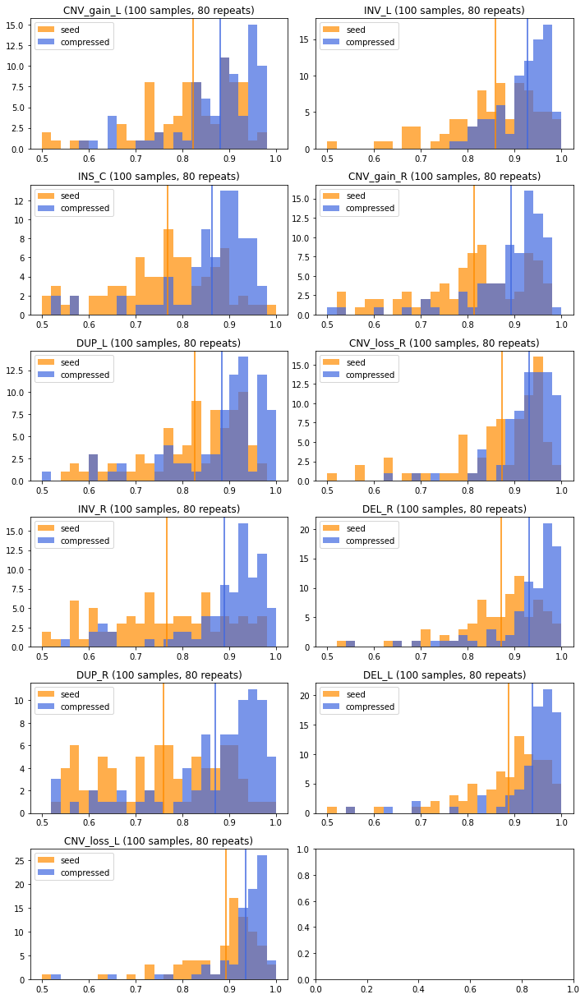

In [6]:
fig, axs = plt.subplots(6, 2, figsize=(10, 17))
for ax, js in zip(axs.flat, glob.glob('./bin0427/compress_*.json')):
    name = os.path.basename(js).replace('compress_HGDP_', '').replace('.json', '')
    with open(js, 'r') as f:
        table = json.load(f)
        labels = [('seed', 'darkorange', 1,), ('compressed', 'royalblue', 2,)] # label, color, index
        ax.set_title(f'{name} ({table[1][0]} samples, {len(table[1][1])} repeats)')
        for l, c, i in labels:
            ax.hist(table[1][i], bins=np.arange(0.5, 1.02, 0.02), label=l, alpha=0.7, color=c)
            ax.axvline(x=np.mean(table[1][i]), color=c)
        ax.legend()
fig.tight_layout()

## 4. Поиск мотива для каждого кластера

На предыдущих шагах показано, что разделение на 2 кластера является оптимальным. 
Теперь сжимаем данные в 8 раз и осуществляем кластеризацию на 2 кластера методом K-Means, используя расстояние `dtw` (пакет `tslearn.metrics`). Для каждого найденного кластера ищем мотивы в несжатых данных модифицированным алгоритмом `KMS` с двумя фиксированными, а не случайно выбранными "базисами".

Кластеризация проводится множество раз на новых выборках (бутстрап). 
Далее классы выравниваются друг относительно друга используя минимальное расстояние `dtw` между усреднёнными значениями кластеров.

```bash
# Около 20 часов работы для 10000 образцов и 80 повторов, 
# Можно запускать параллельно (&), не требует многопоточности
for src in ./bin0427/*.bin; do
  python3 Clusters_KMS_bootstrap.py src:$src dataset:10000 repeats:84 &
done


# Поиск мотивов с меньшим сжатием (x4) и с меньшим окном (1/4, 1/8 сигнала)
for src in ./bin0412/*.bin; do
  python3 Clusters_KMS_bootstrap.py src:$src sax:128 alphabet:24 window:32 dataset:2000 repeats:40 &
  python3 Clusters_KMS_bootstrap.py src:$src sax:128 alphabet:24 window:16 dataset:2000 repeats:40 &
done
```

## 5. Группировка мотивов для всех прогонов

Все найденные мотивы во всех прогонах группируются в общие мотивы, если расстояние между ними меньше порогового. Расстояние между мотивами определяется как среднее SAX-расстояние между всеми возможными парами сигналов из двух мотивов.


```bash
for src in bin0427/motif*.json; do
 python3 Group_motif.py $src R10K &
done
```

In [9]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) { return false; }

<IPython.core.display.Javascript object>


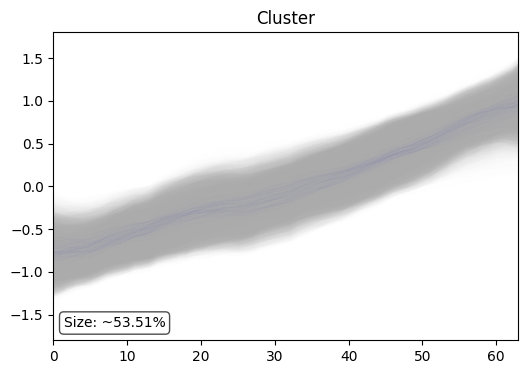
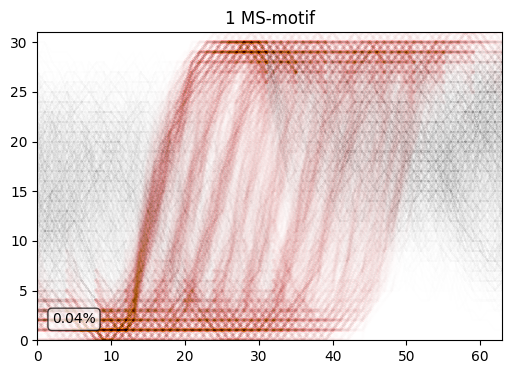
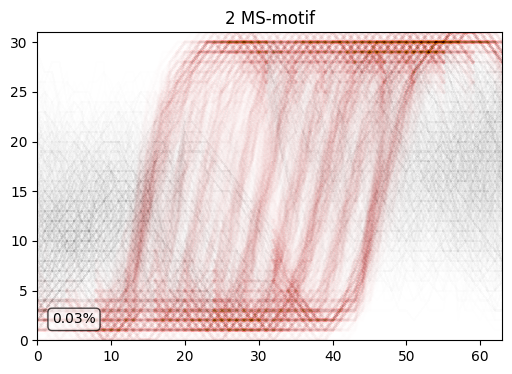
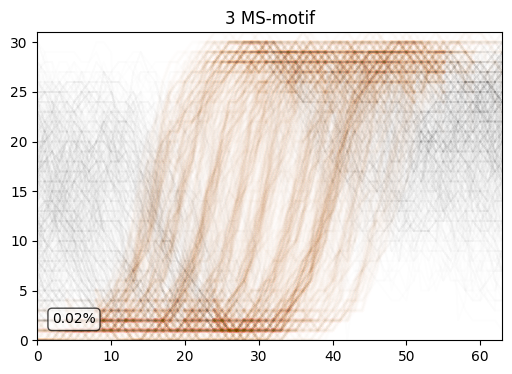
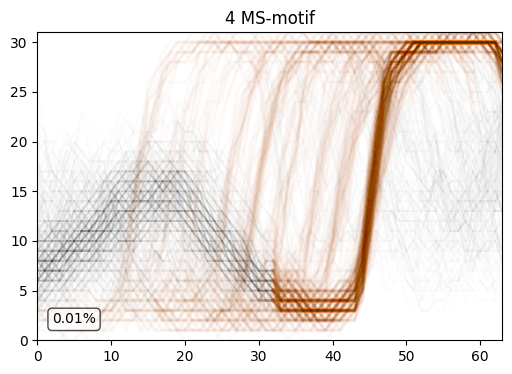


...


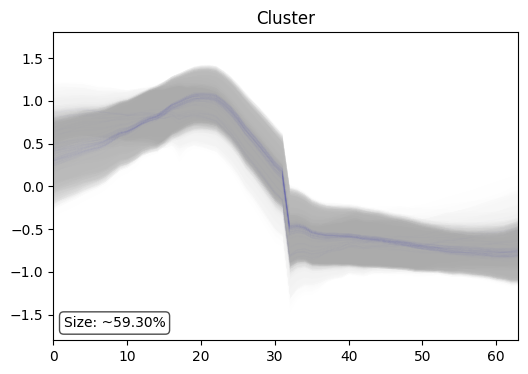
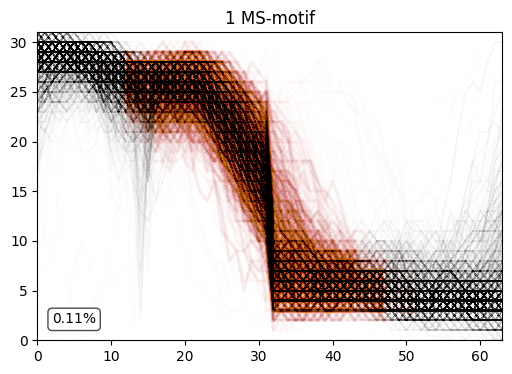
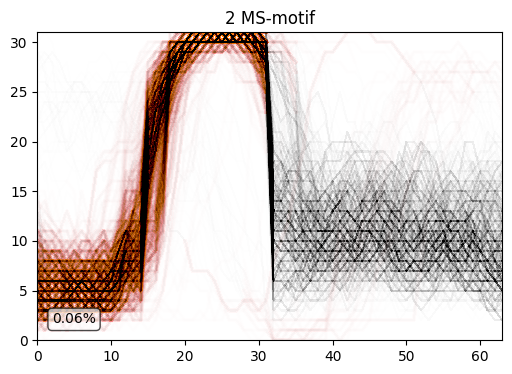
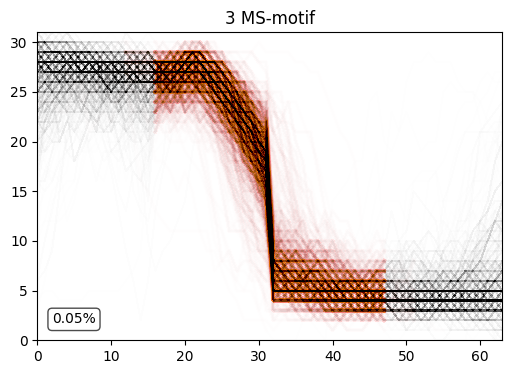
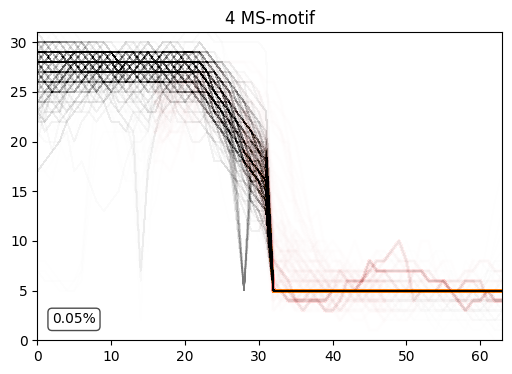

In [10]:
import re, glob, json
from IPython.display import Markdown as md
from IPython.display import HTML

def plot(CM, title):
    src = [CM['cluster']] + [img['plot'] for img in CM['motif']]
    images = [(f'<img class="p-img" src="data:image/png;base64,{s}" /> ') for s in src]
    display(HTML(f'<h3 style="display:flex;">{title}</h3>'))    
    display(HTML(f'<div style="display:flex;">{" ".join(images)}</div>'))    

display(HTML('<style>.p-img { width: 20%; margin: 0 !important; display: block }</style>'))
for src in sorted(glob.glob("bin0427/meta_R10K*")):
    name = re.search("\.([A-Za-z_]+)_s*", src).groups()[0]
    with open(src, 'r') as f:
        try:
            AM, BM = json.load(f)
            if AM: plot(AM, f'{name} – A')
            if BM: plot(BM, f'{name} – B')
        except:
            print(f'ERROR: {src}')
            pass
        


## Экспорт данных для интерфейса

```bash
cd bin0427
zip downloads.zip {*.bin,meta_*,*.motif}
```

## Поиск мотива в инсерциях без кластеризации:

```bash
for sax in 64 128 256: do
  python3 KMS_bootstrap.py src:bin0427/HGDP_INS_C_filterd.bin sax:$sax alphabet:24 window:32 dataset:5000 repeats:48 &
done
```